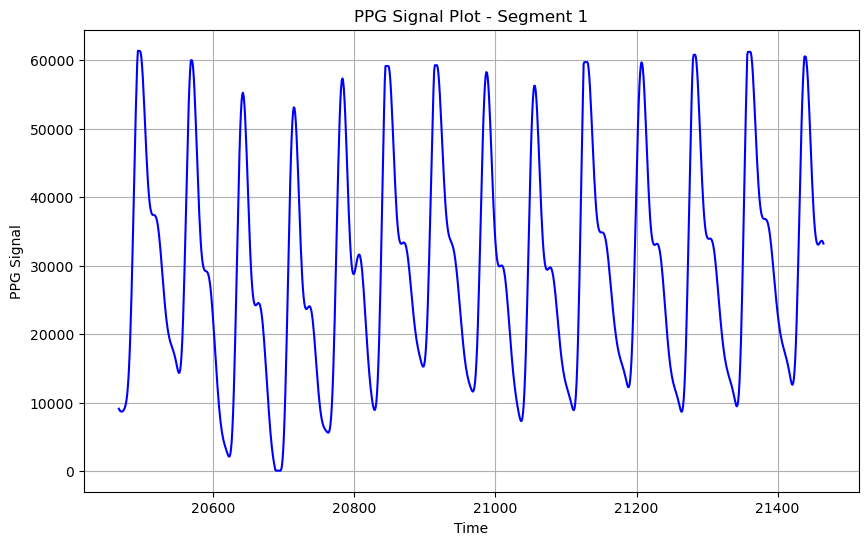

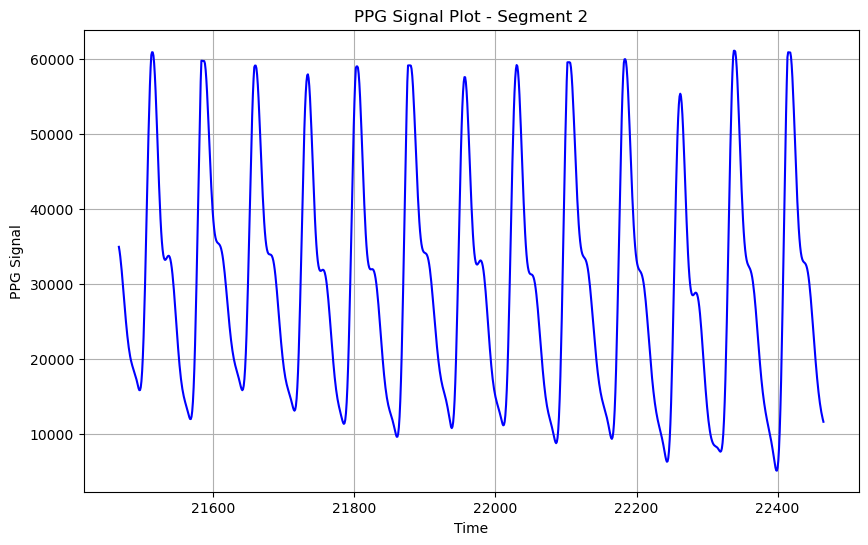

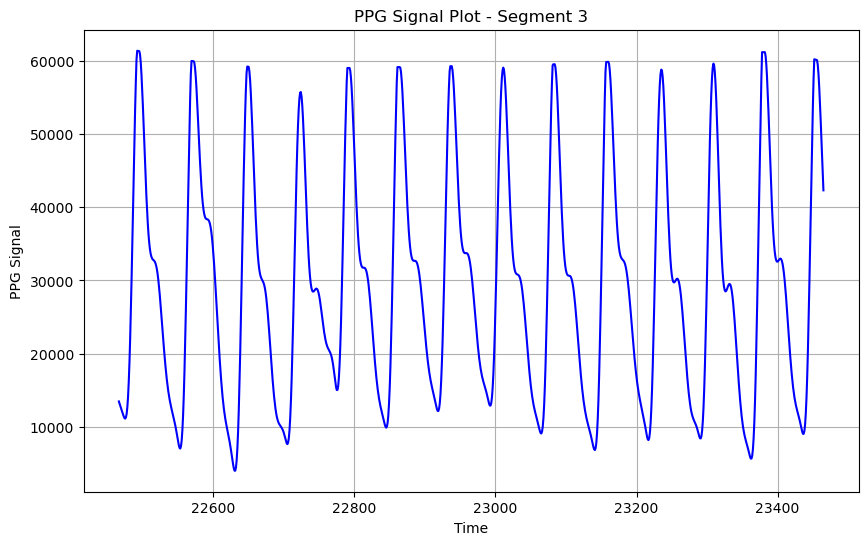

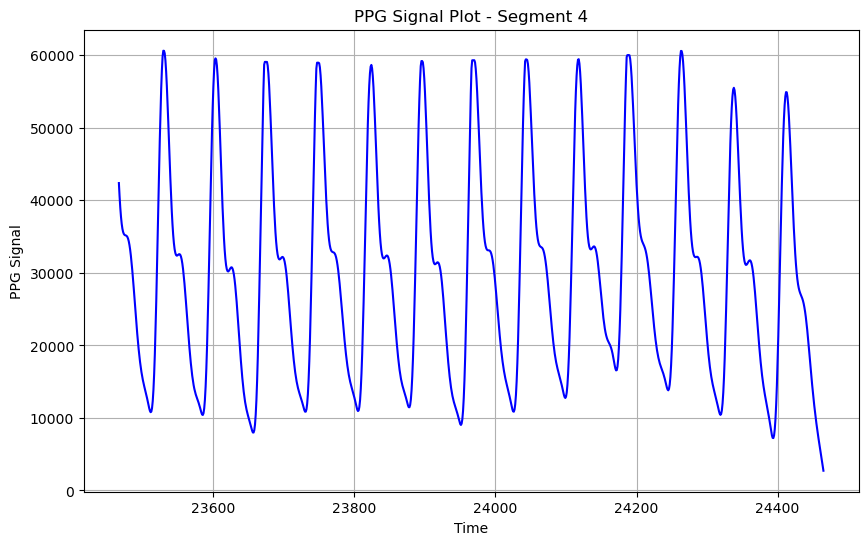

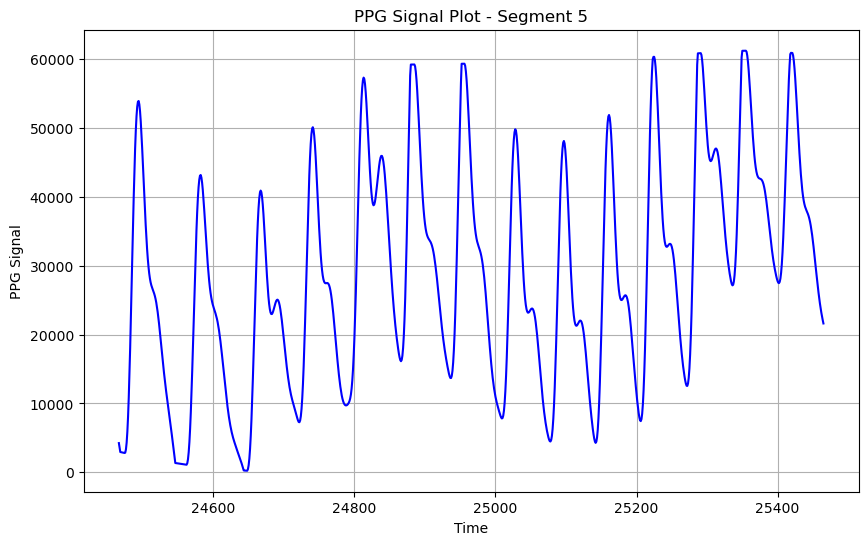

...

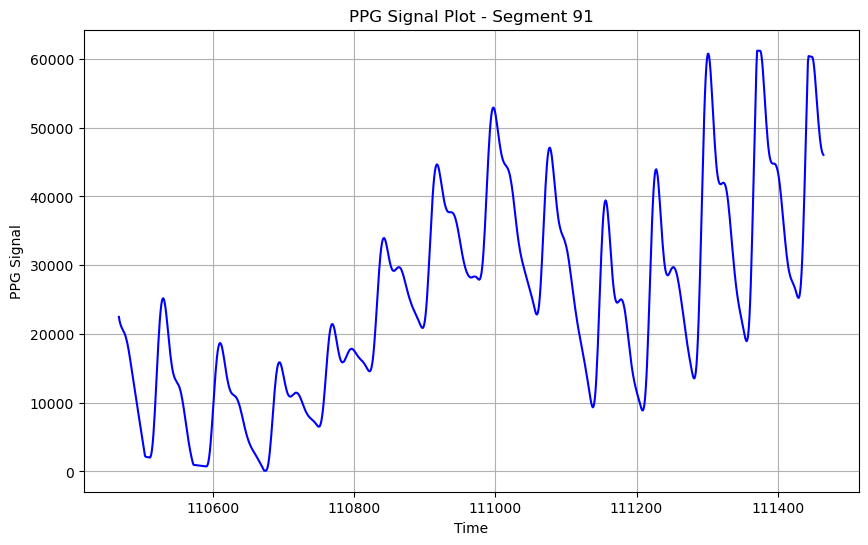

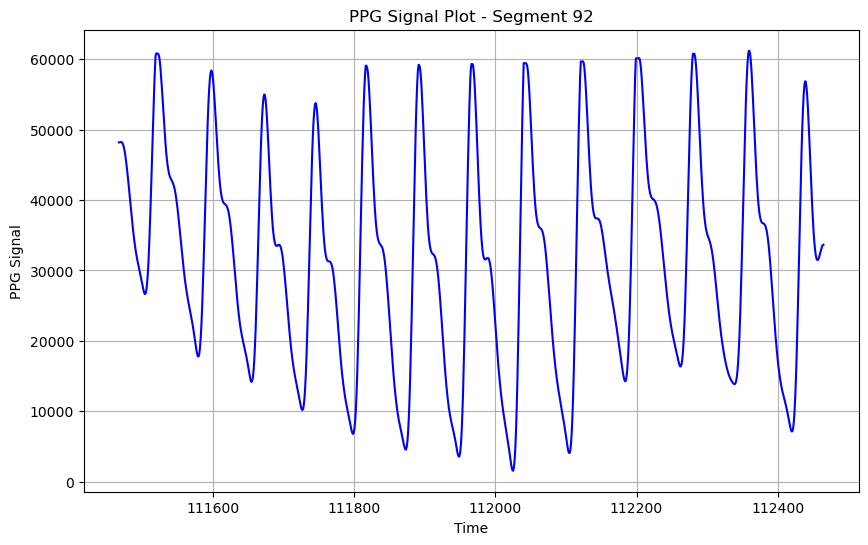

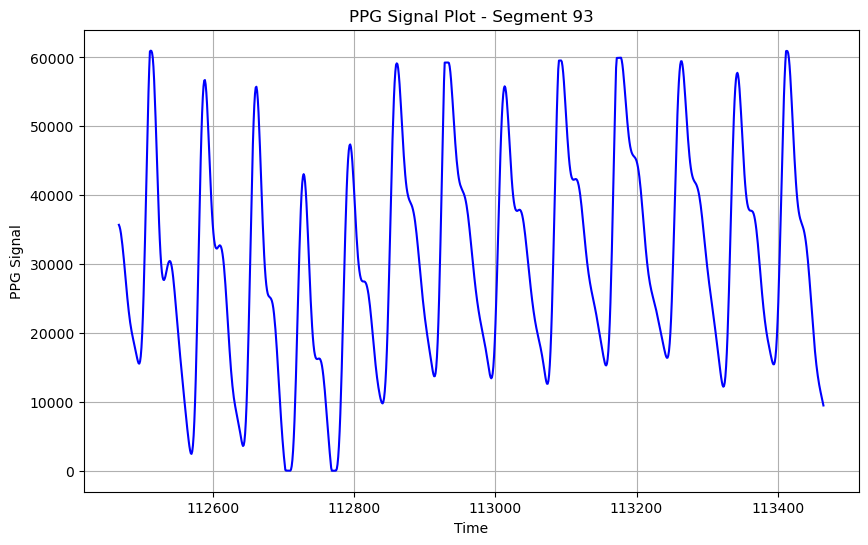

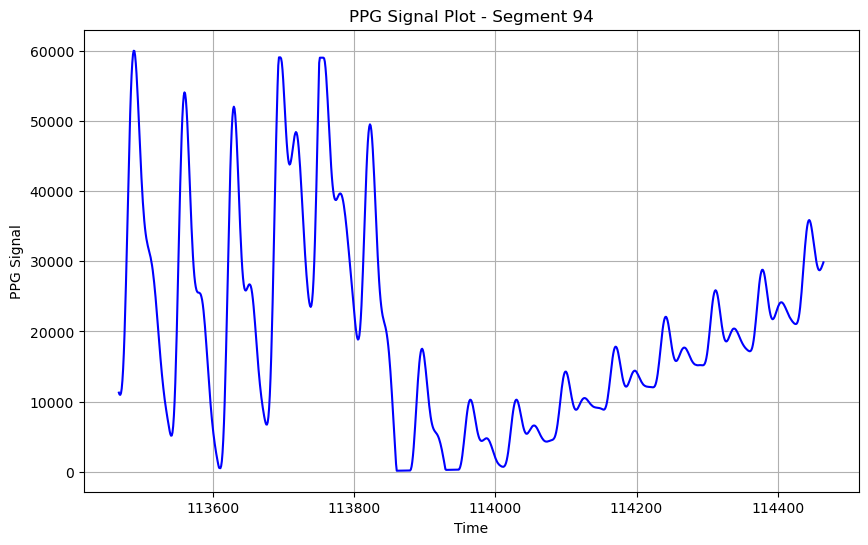

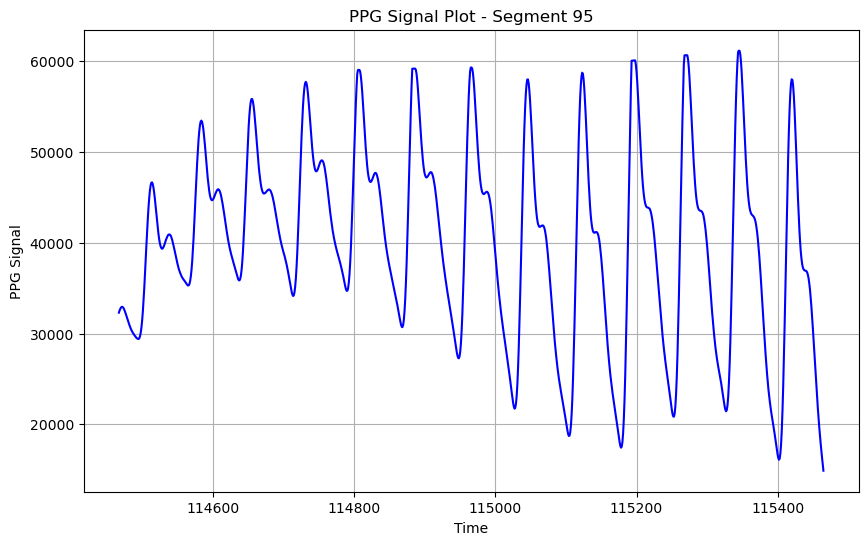

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Read the CSV file containing the PPG signal data
csv_file = "tasmir_70_500_with_shifted_signal.csv"
df = pd.read_csv(csv_file)

# Assuming each segment has 1000 data points
segment_size = 1000
num_segments = len(df) // segment_size

# Plot each segment of data
for i in range(num_segments):
    start_index = i * segment_size
    end_index = min((i + 1) * segment_size, len(df))
    
    time = df['index'][start_index:end_index] 
    ppg_signal = df['ShiftedSignal'][start_index:end_index]
    
    plt.figure(figsize=(10, 6))
    plt.plot(time, ppg_signal, color='b', linestyle='-')
    plt.xlabel('Time')
    plt.ylabel('PPG Signal')
    plt.title(f'PPG Signal Plot - Segment {i+1}')
    plt.grid(True)
    plt.show()


In [ ]:
segment_size = 1000
num_segments = len(df) // segment_size

# Define the time scale factor
time_scale_factor = 0.01  # 100 indices represent 1 second

# Plot each segment of data
for i in range(num_segments):
    start_index = i * segment_size
    end_index = min((i + 1) * segment_size, len(df))
    
    time = (df['index'][start_index:end_index] - df['index'][start_index]) * time_scale_factor
    ppg_signal = (df['ShiftedSignal'][start_index:end_index] )
    
    plt.figure(figsize=(10, 6))
    plt.plot(time, ppg_signal, color='b', linestyle='-')
    plt.xlabel('Time (seconds)')
    plt.ylabel('PPG Signal')
    plt.title(f'PPG Signal Plot - Segment {i+1}')
    plt.grid(True)
    plt.show()

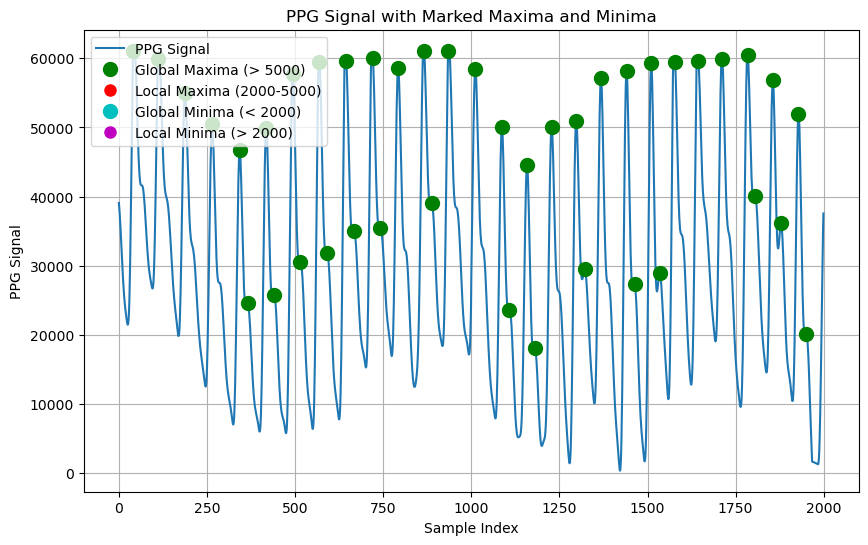

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the PPG signal from the CSV file
csv_file_path = 'tasmir_70_500_with_shifted_signal.csv'  # Replace 'ppg_signal.csv' with your file path
df = pd.read_csv(csv_file_path)
ppg_signal = df['ShiftedSignal'].values[10000:12000]

# Find global maxima greater than 5000

# Find global maxima greater than 5000
# Find global maxima greater than 5000
global_maxima, _ = find_peaks(ppg_signal, height=5000)

# Find local maxima less than 5000 and greater than 2000
local_maxima, _ = find_peaks(ppg_signal, height=(2000, 5000))

# Find global minima less than 2000
global_minima, _ = find_peaks(-ppg_signal, height=2000)

# Find local minima greater than 2000
local_minima, _ = find_peaks(-ppg_signal, height=2000)
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]
# Plot the PPG signal with marked maxima and minima
plt.figure(figsize=(10, 6))
plt.plot(ppg_signal, label='PPG Signal')

# Mark global maxima with green dots
plt.plot(global_maxima, ppg_signal[global_maxima], 'go', markersize=10, label='Global Maxima (> 5000)')

# Mark local maxima with red dots
plt.plot(local_maxima, ppg_signal[local_maxima], 'ro', markersize=8, label='Local Maxima (2000-5000)')

# Mark global minima with cyan dots
plt.plot(global_minima, ppg_signal[global_minima], 'co', markersize=10, label='Global Minima (< 2000)')

# Mark local minima with magenta dots
plt.plot(local_minima, ppg_signal[local_minima], 'mo', markersize=8, label='Local Minima (> 2000)')

plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Marked Maxima and Minima')
plt.legend()
plt.grid(True)
plt.show()

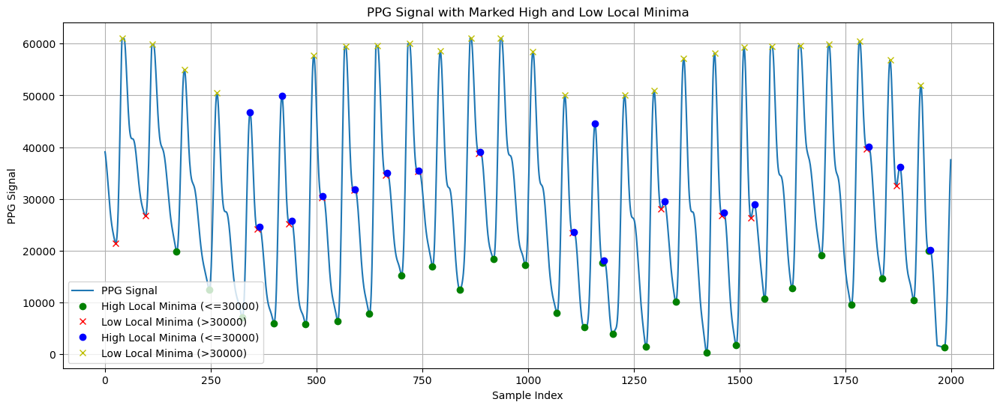

In [21]:
time_stamps = df['Time'].to_numpy()
# Peak detection for local minima in the PPG signal
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]
maxima_indices, _ = find_peaks(ppg_signal)  # Using negative signal to find minima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as high or low based on amplitude
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 20000]
low_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value > 20000]

# # Print high local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("High Local Minima (<=30000):")
# for peak in high_minima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")

# # Print low local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("\nLow Local Minima (>30000):")
# for peak in low_minima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")
    
high_maxima_indices = [index for index, value in zip(maxima_indices, maxima_values) if value <= 50000]
low_maxima_indices = [index for index, value in zip(maxima_indices, maxima_values) if value > 50000]

# # Print high local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("High Local maximaa (<=50000):")
# for peak in high_maxima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")

# # Print low local minima values and corresponding time stamps (assuming time_stamps has aligned indices)
# print("\nLow Local maxima (>30000):")
# for peak in low_maxima_indices:
#     print(f"- Value: {ppg_signal[peak]}, Time: {time_stamps[peak]} ms")

# Plot the PPG signal with marked high and low local minima

# Plot the PPG signal with marked high and low local minima
plt.figure(figsize=(16, 6))  # Adjust figure size as needed
plt.plot(ppg_signal, label='PPG Signal')

# Mark high local minima with green circles
plt.plot(high_minima_indices, ppg_signal[high_minima_indices], 'go', markersize=6, label='High Local Minima (<=30000)')

# Mark low local minima with red crosses
plt.plot(low_minima_indices, ppg_signal[low_minima_indices], 'rx', markersize=6, label='Low Local Minima (>30000)')

# plt.xlabel('Sample Index')
# plt.ylabel('PPG Signal')
# plt.title('PPG Signal with Marked High and Low Local Minima')
# plt.legend()
# plt.grid(True)
# plt.show()

# Peak detection for local minima in the PPG signal
maxima_indices, _ = find_peaks(ppg_signal)  # Using negative signal to find minima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as high or low based on amplitude

# plt.figure(figsize=(12, 6))  # Adjust figure size as needed
# plt.plot(ppg_signal, label='PPG Signal')

# Mark high local minima with green circles
plt.plot(high_maxima_indices, ppg_signal[high_maxima_indices], 'bo', markersize=6, label='High Local Minima (<=30000)')

# Mark low local minima with red crosses
plt.plot(low_maxima_indices, ppg_signal[low_maxima_indices], 'yx', markersize=6, label='Low Local Minima (>30000)')

plt.xlabel('Sample Index')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Marked High and Low Local Minima')
plt.legend()
plt.grid(True)
plt.show()

In [22]:
# Peak detection for local minima in the PPG signal
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]

# Classify minima as high or low based on amplitude
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 20000]
low_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value > 20000]

# Calculate time difference between high local minima to the next low local minima
high_to_low_time_diff = []
for high_index in high_minima_indices:
    next_low_index = min([low_index for low_index in low_minima_indices if low_index > high_index], default=None)
    if next_low_index is not None:
        time_diff = time_stamps[next_low_index] - time_stamps[high_index]
        high_to_low_time_diff.append(time_diff)

# Print time differences
print("Time Difference between High Local Minima to Next Low Local Minima:")
print(high_to_low_time_diff)

# Peak detection for local minima in the PPG signal
maxima_indices, _ = find_peaks(ppg_signal)  # Using negative signal to find minima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as high or low based on amplitude
high_maxima_indices = [index for index, value in zip(maxima_indices, maxima_values) if value > 50000]
high_minima_indices = [index for index, value in zip(minima_indices, minima_values) if value <= 50000]

# Calculate time difference between high local minima to the next low local minima
high_to_low_time_diff = []
for high_index in high_maxima_indices:
    next_low_index = min([low_index for low_index in low_minima_indices if low_index > high_index], default=None)
    if next_low_index is not None:
        time_diff = time_stamps[next_low_index] - time_stamps[high_index]
        high_to_low_time_diff.append(time_diff)

# Print time differences
print("Time Difference between High Local Minima to Next Low Local Minima:")
print(high_to_low_time_diff)

Time Difference between High Local Minima to Next Low Local Minima:
[1910, 1140, 360, 360, 380, 380, 380, 380, 1090, 440, -8130, -8880, 370, 1810, 1380, 1140, 350, 1090, 360, 350, 2410, 1760, 1070, 360, 330]
Time Difference between High Local Minima to Next Low Local Minima:
[550, 2490, 1720, 950, 190, 190, 190, 190, 910, 180, -8300, 940, 180, 860, 160, 900, 170, 170, 2230, 1570, 890, 160, 140]


In [23]:
# Calculate time difference between high_minima_indices and high_maxima_indices
high_to_high_time_diff = []
for high_min_index in high_minima_indices:
    next_high_max_index = min([high_max_index for high_max_index in high_maxima_indices if high_max_index > high_min_index], default=None)
    if next_high_max_index is not None:
        time_diff = time_stamps[next_high_max_index] - time_stamps[high_min_index]
        high_to_high_time_diff.append(time_diff)

# Calculate time difference between high_minima_indices and low_maxima_indices
high_to_low_time_diff = []
for high_min_index in high_minima_indices:
    next_low_max_index = min([low_max_index for low_max_index in low_maxima_indices if low_max_index > high_min_index], default=None)
    if next_low_max_index is not None:
        time_diff = time_stamps[next_low_max_index] - time_stamps[high_min_index]
        high_to_low_time_diff.append(time_diff)

# Print time differences
print("Time Difference between High Minima and High Maxima:")
print(high_to_high_time_diff)

print("\nTime Difference between High Minima and Low Maxima:")
print(high_to_low_time_diff)



Time Difference between High Minima and High Maxima:
[150, 160, 190, 190, 1690, 1330, 940, 580, 190, 570, 190, 560, 190, 570, 190, 530, 180, 260, 520, 170, -9820, 190, 1230, 950, 520, 280, 190, 540, 190, 190, 520, 180, 500, 180, 190, 180, 200, 560, 190, 580, 170]

Time Difference between High Minima and Low Maxima:
[150, 160, 190, 190, 1690, 1330, 940, 580, 190, 570, 190, 560, 190, 570, 190, 530, 180, 260, 520, 170, -9820, 190, 1230, 950, 520, 280, 190, 540, 190, 190, 520, 180, 500, 180, 190, 180, 200, 560, 190, 580, 170]


In [24]:
# Extract amplitude values for high and low minima
high_minima_amplitudes = ppg_signal[high_minima_indices]
low_minima_amplitudes = ppg_signal[low_minima_indices]

# Extract amplitude values for high and low maxima
high_maxima_amplitudes = ppg_signal[high_maxima_indices]
low_maxima_amplitudes = ppg_signal[low_maxima_indices]

# Print or analyze the extracted amplitude values
print("Amplitudes of High Minima:")
print(high_minima_amplitudes)

print("\nAmplitudes of Low Minima:")
print(low_minima_amplitudes)

print("\nAmplitudes of High Maxima:")
print(high_maxima_amplitudes)

print("\nAmplitudes of Low Maxima:")
print(low_maxima_amplitudes)


Amplitudes of High Minima:
[21479.72854245 26715.55363446 19834.37002494 12534.91870698
  7045.82251817 24114.41847482  6019.66317405 25164.89387089
  5783.15359871 30241.12824203  6396.89803365 31681.16712319
  7767.46068882 34618.66380851 15281.26530741 35319.78331457
 16939.66008048 12470.89765869 38839.34482004 18389.6231097
 17167.27092311  7922.97626272 23471.69243927  5185.59232628
 17699.35147341  3936.79222812  1427.58985358 28057.51315316
 10083.83416413   356.8324347  26829.45761013  1701.55534213
 26292.17704984 10703.84263262 12797.31121028 19058.99385057
  9582.16320708 39688.5410357  14567.66081099 32507.79854947
 10436.81784299 19973.89577212  1289.08390501]

Amplitudes of Low Minima:
[21479.72854245 26715.55363446 24114.41847482 25164.89387089
 30241.12824203 31681.16712319 34618.66380851 35319.78331457
 38839.34482004 23471.69243927 28057.51315316 26829.45761013
 26292.17704984 39688.5410357  32507.79854947]

Amplitudes of High Maxima:
[61083.54856156 59878.33455748 5

In [25]:
# Amplitudes of low local minima (yellow marks)
low_minima_amplitudes = ppg_signal[low_minima_indices]

# Amplitudes of high local minima (blue marks)
high_minima_amplitudes = ppg_signal[high_minima_indices]

# Amplitudes of high local maxima (red marks)
high_maxima_amplitudes = ppg_signal[high_maxima_indices]

# Print or use these amplitude arrays as needed
print("Amplitudes of Low Local Minima (Yellow Marks):", low_minima_amplitudes)
print("Amplitudes of High Local Minima (Blue Marks):", high_minima_amplitudes)
print("Amplitudes of High Local Maxima (Red Marks):", high_maxima_amplitudes)


Amplitudes of Low Local Minima (Yellow Marks): [21479.72854245 26715.55363446 24114.41847482 25164.89387089
 30241.12824203 31681.16712319 34618.66380851 35319.78331457
 38839.34482004 23471.69243927 28057.51315316 26829.45761013
 26292.17704984 39688.5410357  32507.79854947]
Amplitudes of High Local Minima (Blue Marks): [21479.72854245 26715.55363446 19834.37002494 12534.91870698
  7045.82251817 24114.41847482  6019.66317405 25164.89387089
  5783.15359871 30241.12824203  6396.89803365 31681.16712319
  7767.46068882 34618.66380851 15281.26530741 35319.78331457
 16939.66008048 12470.89765869 38839.34482004 18389.6231097
 17167.27092311  7922.97626272 23471.69243927  5185.59232628
 17699.35147341  3936.79222812  1427.58985358 28057.51315316
 10083.83416413   356.8324347  26829.45761013  1701.55534213
 26292.17704984 10703.84263262 12797.31121028 19058.99385057
  9582.16320708 39688.5410357  14567.66081099 32507.79854947
 10436.81784299 19973.89577212  1289.08390501]
Amplitudes of High Lo

In [26]:
# Assuming time_stamps is the array containing time stamps corresponding to each sample index
time_stamps = df['Time'].to_numpy()

# Calculate the time difference between consecutive green dots (high local minima)
time_between_green_dots = []
for i in range(1, len(high_minima_indices)):
    time_diff = time_stamps[high_minima_indices[i]] - time_stamps[high_minima_indices[i - 1]]
    time_between_green_dots.append(time_diff)

# Print or use the time differences between consecutive green dots as needed
print("Time Between Consecutive Green Dots (High Local Minima):", time_between_green_dots)


Time Between Consecutive Green Dots (High Local Minima): [700, 740, 770, 780, 360, 390, 360, 390, 380, 380, 380, 370, 380, 380, 380, 350, 650, 440, 350, 750, -9250, 370, 280, 430, 240, 790, 350, 350, 730, 360, 340, 350, 320, 650, 690, 710, 360, 370, 330, 410, 360, 370]


In [27]:
# Print the y-axis values of the red crosses (low local minima)
print("Red (Low Local Minima) Y-Values:")
for index in low_minima_indices:
    print(f"Index: {index}, Y-Value: {ppg_signal[index]}")

# Print the y-axis values of the yellow crosses (low local maxima)
print("Yellow (Low Local Maxima) Y-Values:")
for index in low_maxima_indices:
    print(f"Index: {index}, Y-Value: {ppg_signal[index]}")

# Print the y-axis values of the blue circles (high local minima)
print("Blue (High Local Minima) Y-Values:")
for index in high_minima_indices:
    print(f"Index: {index}, Y-Value: {ppg_signal[index]}")


Red (Low Local Minima) Y-Values:
Index: 25, Y-Value: 21479.728542453835
Index: 95, Y-Value: 26715.55363445836
Index: 360, Y-Value: 24114.418474817976
Index: 435, Y-Value: 25164.893870887907
Index: 512, Y-Value: 30241.12824203237
Index: 588, Y-Value: 31681.167123187017
Index: 663, Y-Value: 34618.66380851102
Index: 739, Y-Value: 35319.78331457231
Index: 883, Y-Value: 38839.34482004392
Index: 1105, Y-Value: 23471.692439271705
Index: 1314, Y-Value: 28057.513153157743
Index: 1458, Y-Value: 26829.45761013122
Index: 1527, Y-Value: 26292.177049838094
Index: 1800, Y-Value: 39688.54103570061
Index: 1870, Y-Value: 32507.798549471136
Yellow (Low Local Maxima) Y-Values:
Index: 40, Y-Value: 61083.548561564414
Index: 111, Y-Value: 59878.33455747576
Index: 188, Y-Value: 54986.970075343954
Index: 265, Y-Value: 50458.49164542047
Index: 493, Y-Value: 57741.94086494359
Index: 569, Y-Value: 59419.69214983185
Index: 644, Y-Value: 59622.35028304238
Index: 720, Y-Value: 60018.00254767605
Index: 792, Y-Value: 

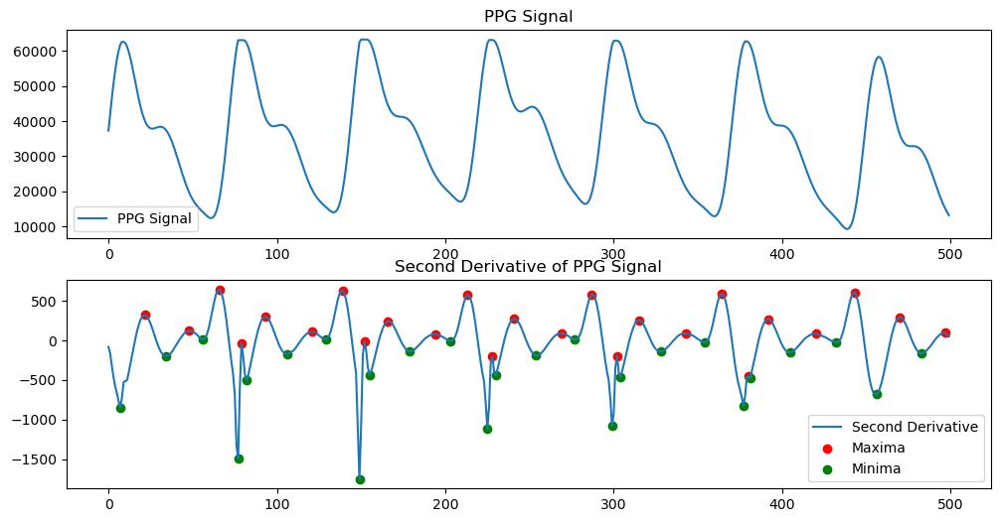

PPG values at maxima: [39653.43024072 19577.47334144 18326.46229019 63034.35270492
 41188.92862807 20386.46989962 20171.39487633 63216.66611921
 44457.90608882 24561.43096108 20449.83800638 63081.08397389
 44298.91828895 25721.61917294 19651.9416677  62849.69719451
 42551.51460031 20890.43745713 16773.17616565 62461.95125807
 41474.65965142 19653.327677   13825.07613906 36024.38474952
 14936.17810514]
PPG values at minima: [61761.09790119 37551.24509742 14116.13410843 63024.01412632
 62250.34868734 38065.24248734 15549.76849084 62450.39697389
 62716.38846219 39973.12235881 19357.25617355 62177.9991756
 62252.05614151 43566.18624287 19404.07692375 61648.26305643
 62059.07440847 37500.90047853 15155.03184666 61862.8532019
 61671.03609118 37003.59738902 12362.70943021 57634.11761022
 31439.9279038 ]


In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Read the PPG signal data from Excel
df = pd.read_csv('tasmir_10_500_with_shifted_signal.csv')  # Replace 'ppg_data.xlsx' with your file name
ppg_signal = df['ShiftedSignal'].values[:500]

# Step 2: Compute the second derivative of the PPG signal
second_derivative = np.gradient(np.gradient(ppg_signal))

# Step 3: Plot the PPG signal and its second derivative
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
plt.plot(ppg_signal, label='PPG Signal')
plt.title('PPG Signal')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(second_derivative, label='Second Derivative')
plt.title('Second Derivative of PPG Signal')
plt.legend()

# Step 4: Identify maxima and minima of the second derivative
maxima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) < 0))[0] + 1
minima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) > 0))[0] + 1

# Step 5: Find corresponding values in the PPG signal
maxima_values = ppg_signal[maxima_indices]
minima_values = ppg_signal[minima_indices]

# Plot the maxima and minima on the second derivative plot
plt.scatter(maxima_indices, second_derivative[maxima_indices], color='red', label='Maxima')
plt.scatter(minima_indices, second_derivative[minima_indices], color='green', label='Minima')
plt.legend()

plt.show()

# Print the values where maxima and minima occur in the PPG signal
print("PPG values at maxima:", maxima_values)
print("PPG values at minima:", minima_values)


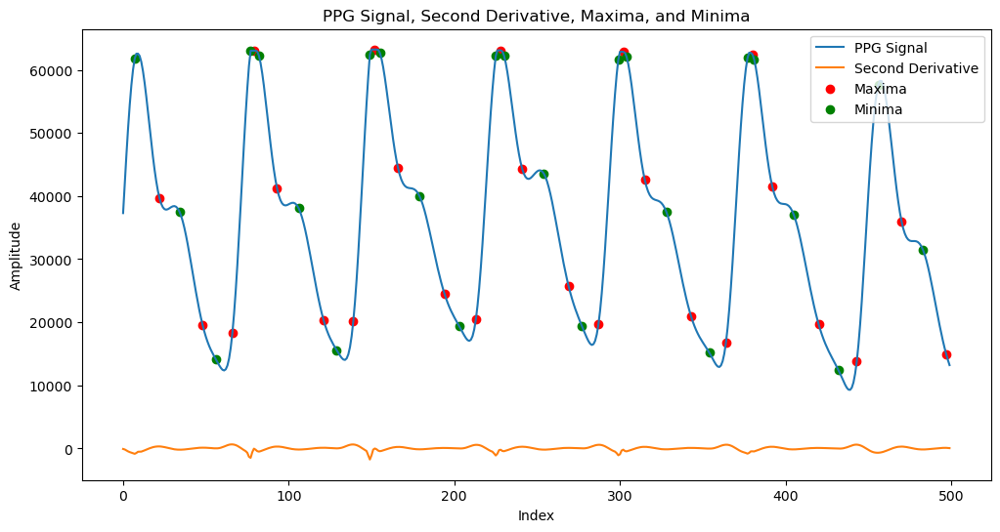

PPG values at maxima: [39653.43024072 19577.47334144 18326.46229019 63034.35270492
 41188.92862807 20386.46989962 20171.39487633 63216.66611921
 44457.90608882 24561.43096108 20449.83800638 63081.08397389
 44298.91828895 25721.61917294 19651.9416677  62849.69719451
 42551.51460031 20890.43745713 16773.17616565 62461.95125807
 41474.65965142 19653.327677   13825.07613906 36024.38474952
 14936.17810514]
PPG values at minima: [61761.09790119 37551.24509742 14116.13410843 63024.01412632
 62250.34868734 38065.24248734 15549.76849084 62450.39697389
 62716.38846219 39973.12235881 19357.25617355 62177.9991756
 62252.05614151 43566.18624287 19404.07692375 61648.26305643
 62059.07440847 37500.90047853 15155.03184666 61862.8532019
 61671.03609118 37003.59738902 12362.70943021 57634.11761022
 31439.9279038 ]


In [41]:
# Step 2: Compute the second derivative of the PPG signal
second_derivative = np.gradient(np.gradient(ppg_signal))

# Step 3: Identify maxima and minima of the second derivative
maxima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) < 0))[0] + 1
minima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) > 0))[0] + 1

# Step 4: Find corresponding values in the PPG signal
maxima_values = ppg_signal[maxima_indices]
minima_values = ppg_signal[minima_indices]

# Plot the PPG signal, its second derivative, maxima, and minima
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(second_derivative, label='Second Derivative')
plt.scatter(maxima_indices, maxima_values, color='red', label='Maxima')
plt.scatter(minima_indices, minima_values, color='green', label='Minima')
plt.xlabel('Index')
plt.ylabel('Amplitude')
plt.title('PPG Signal, Second Derivative, Maxima, and Minima')
plt.legend()
plt.show()

# Print the values where maxima and minima occur in the PPG signal
print("PPG values at maxima:", maxima_values)
print("PPG values at minima:", minima_values)

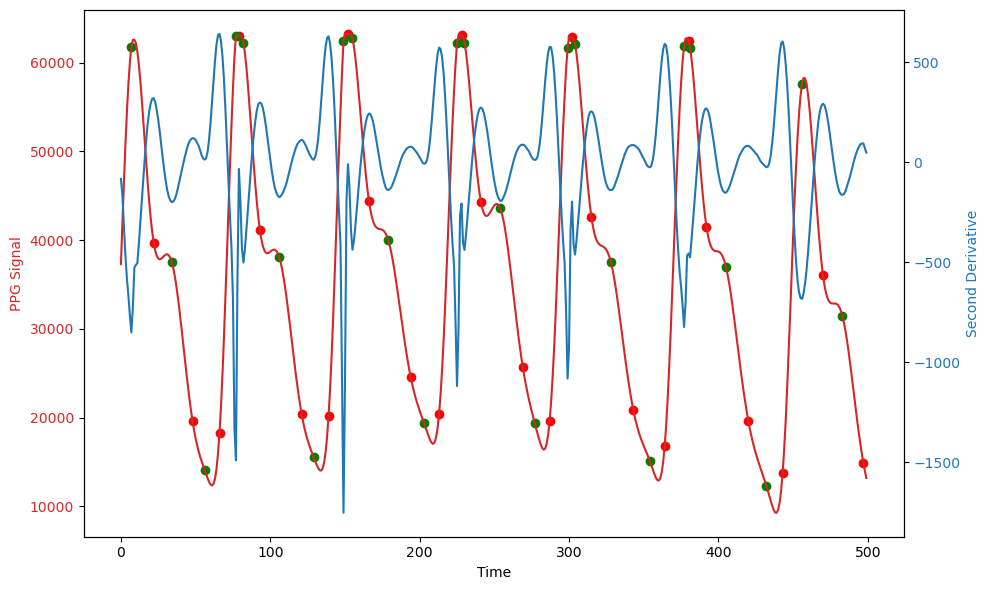

<Figure size 1200x600 with 0 Axes>

In [42]:
# Step 2: Compute the second derivative of the PPG signal
second_derivative = np.gradient(np.gradient(ppg_signal))

# Step 3: Plot the PPG signal and its second derivative on the same scale
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('PPG Signal', color=color)
ax1.plot(ppg_signal, color=color, label='PPG Signal')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('Second Derivative', color=color)
ax2.plot(second_derivative, color=color, label='Second Derivative')
ax2.tick_params(axis='y', labelcolor=color)

# Step 4: Identify maxima and minima of the second derivative
maxima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) < 0))[0] + 1
minima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) > 0))[0] + 1

# Step 5: Find corresponding values in the PPG signal
maxima_values = ppg_signal[maxima_indices]
minima_values = ppg_signal[minima_indices]

# Plot the maxima and minima points on the same plot
ax1.scatter(maxima_indices, maxima_values, color='red', label='Maxima')
ax1.scatter(minima_indices, minima_values, color='green', label='Minima')
plt.figure(figsize=(12, 6))
# Show legend
fig.tight_layout()
# plt.legend()
plt.show()

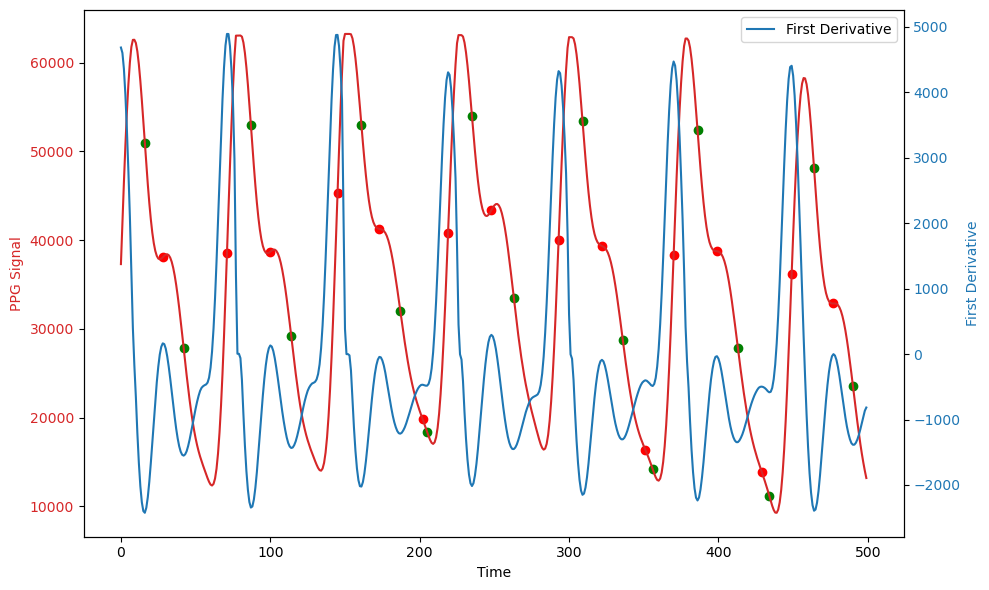

In [43]:
# Step 2: Compute the first derivative of the PPG signal
first_derivative = np.gradient(ppg_signal)

# Step 3: Plot the PPG signal and its first derivative on the same scale
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:red'
ax1.set_xlabel('Time')
ax1.set_ylabel('PPG Signal', color=color)
ax1.plot(ppg_signal, color=color, label='PPG Signal')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
color = 'tab:blue'
ax2.set_ylabel('First Derivative', color=color)
ax2.plot(first_derivative, color=color, label='First Derivative')
ax2.tick_params(axis='y', labelcolor=color)

# Step 4: Identify maxima and minima of the first derivative
maxima_indices = np.where((np.diff(np.sign(np.diff(first_derivative))) < 0))[0] + 1
minima_indices = np.where((np.diff(np.sign(np.diff(first_derivative))) > 0))[0] + 1

# Step 5: Find corresponding values in the PPG signal
maxima_values = ppg_signal[maxima_indices]
minima_values = ppg_signal[minima_indices]

# Plot the maxima and minima points on the PPG signal plot
ax1.scatter(maxima_indices, maxima_values, color='red', label='Maxima')
ax1.scatter(minima_indices, minima_values, color='green', label='Minima')

# Show legend
fig.tight_layout()
plt.legend()
plt.show()

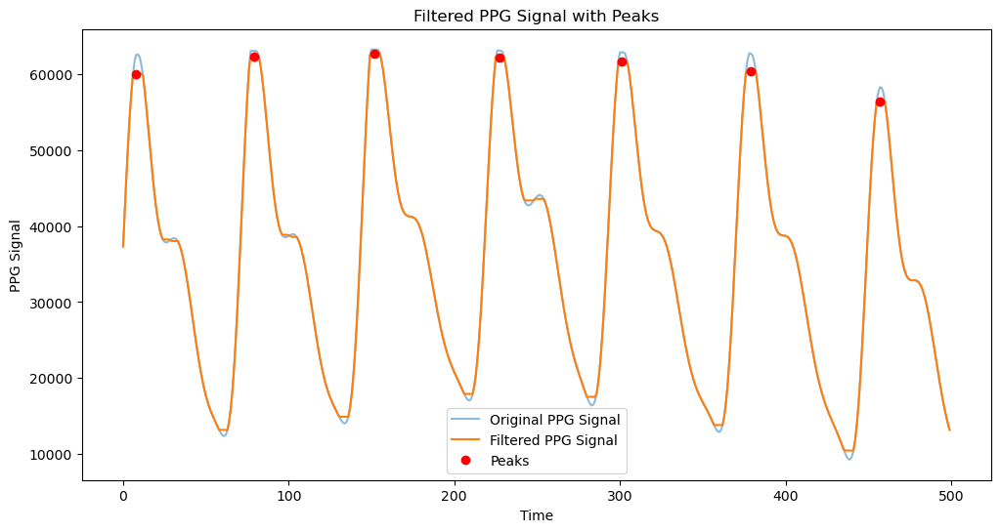

In [44]:
from scipy.signal import find_peaks, medfilt
# Step 2: Preprocess the signal (filtering)
filtered_signal = medfilt(ppg_signal, kernel_size=11)  # Apply median filtering to remove noise

# Step 3: Identify peaks in the filtered signal
peaks, _ = find_peaks(filtered_signal, height=0.1, distance=50)  # Adjust parameters as needed

# Step 4: Plot the filtered signal with identified peaks
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='Original PPG Signal', alpha=0.5)
plt.plot(filtered_signal, label='Filtered PPG Signal')
plt.plot(peaks, filtered_signal[peaks], 'ro', label='Peaks')
plt.xlabel('Time')
plt.ylabel('PPG Signal')
plt.title('Filtered PPG Signal with Peaks')
plt.legend()
plt.show()

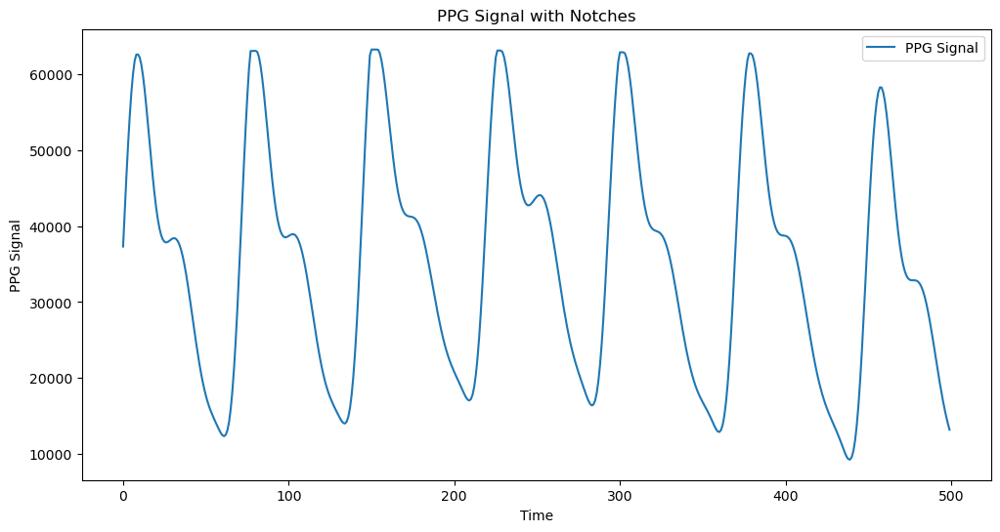

In [45]:
# Step 3: Compute the second derivative of the signal
second_derivative = np.gradient(np.gradient(ppg_signal))

# Step 4: Find peaks in the second derivative
notch_indices, _ = find_peaks(-second_derivative, height=0)  # Use negative of second derivative to find valleys

# Step 5: Plot the PPG signal with identified notches
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='PPG Signal')
# plt.plot(notch_indices, ppg_signal[notch_indices], 'bo', label='Notches')
plt.xlabel('Time')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Notches')
plt.legend()
plt.show()

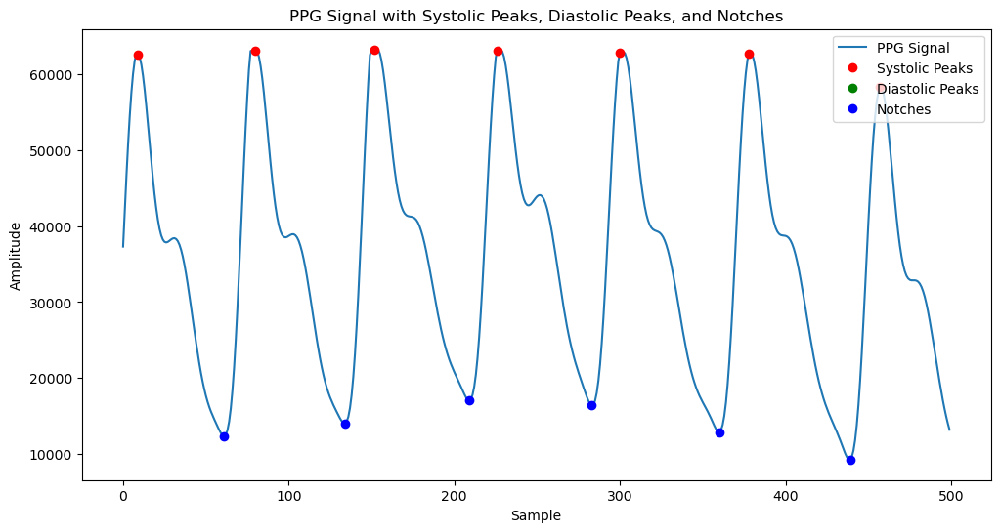

In [46]:
# Step 2: Detect Systolic Peaks
systolic_peaks, _ = find_peaks(ppg_signal, distance=30, height=0.5)  # Adjust parameters as needed

# Step 3: Detect Diastolic Peaks (inverted signal for detection)
inverted_signal = -ppg_signal
diastolic_peaks, _ = find_peaks(inverted_signal, distance=30, height=-0.5)  # Adjust parameters as needed

# Step 4: Find Notches between Systolic and Diastolic Peaks
notch_indices = []
for i in range(len(systolic_peaks) - 1):
    start = systolic_peaks[i]
    end = systolic_peaks[i + 1]
    segment = ppg_signal[start:end]
    notch_index = start + np.argmin(segment)
    notch_indices.append(notch_index)

# Step 5: Plot the results
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(systolic_peaks, ppg_signal[systolic_peaks], 'ro', label='Systolic Peaks')
plt.plot(diastolic_peaks, ppg_signal[diastolic_peaks], 'go', label='Diastolic Peaks')
plt.plot(notch_indices, ppg_signal[notch_indices], 'bo', label='Notches')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.title('PPG Signal with Systolic Peaks, Diastolic Peaks, and Notches')
plt.legend()
plt.show()

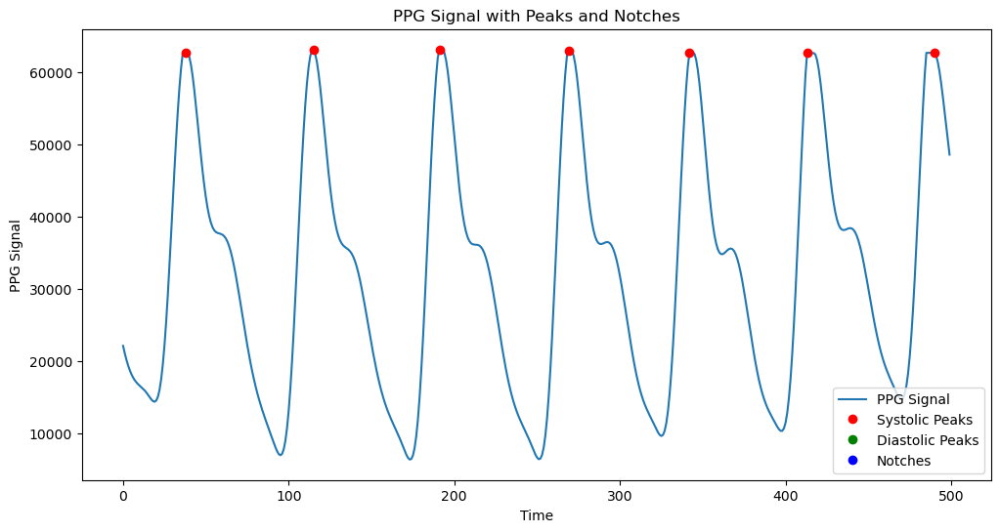

In [12]:
# Step 3: Find systolic peaks
systolic_peaks, _ = find_peaks(ppg_signal, height=0.1, distance=50)  # Adjust parameters as needed

# Step 4: Find diastolic valleys (peaks in the negative of the signal)
neg_ppg_signal = -ppg_signal
diastolic_peaks, _ = find_peaks(neg_ppg_signal, height=0.1, distance=50)

# Step 5: Find notches as points between diastolic and systolic peaks
notch_indices = []
for systolic_peak in systolic_peaks:
    if diastolic_peaks.size > 0:
        nearest_diastolic_peak = min(diastolic_peaks, key=lambda x: abs(x - systolic_peak))
        if systolic_peak > nearest_diastolic_peak:
            notch_index = (nearest_diastolic_peak + systolic_peak) // 2
            notch_indices.append(notch_index)

# Step 6: Plot the PPG signal with marked peaks and notches
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(systolic_peaks, ppg_signal[systolic_peaks], 'ro', label='Systolic Peaks')
plt.plot(diastolic_peaks, ppg_signal[diastolic_peaks], 'go', label='Diastolic Peaks')
plt.plot(notch_indices, ppg_signal[notch_indices], 'bo', label='Notches')
plt.xlabel('Time')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Peaks and Notches')
plt.legend()
plt.show()

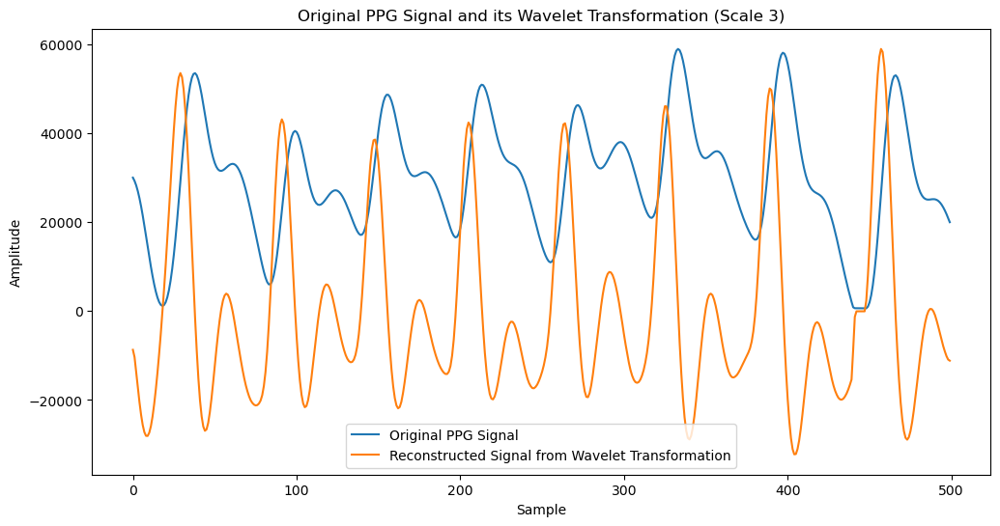

In [31]:
derivative = np.gradient(ppg_signal)

# Step 3: Perform wavelet transformation on the derivative at scale 3
wavelet = 'db4'  # Choose the wavelet type, 'db4' is just an example
coefficients = pywt.wavedec(derivative, wavelet, level=3)

# Step 4: Reconstruct the PPG signal from the wavelet coefficients
reconstructed_signal = pywt.waverec(coefficients, wavelet)

# Step 5: Rescale the reconstructed signal to match the amplitude of the original signal
reconstructed_signal_rescaled = reconstructed_signal * (np.max(ppg_signal) / np.max(reconstructed_signal))

# Step 6: Plot the original PPG signal and its wavelet transformation in the same plot
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='Original PPG Signal')
plt.plot(reconstructed_signal_rescaled, label='Reconstructed Signal from Wavelet Transformation')
plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.title('Original PPG Signal and its Wavelet Transformation (Scale 3)')
plt.legend()
plt.show()

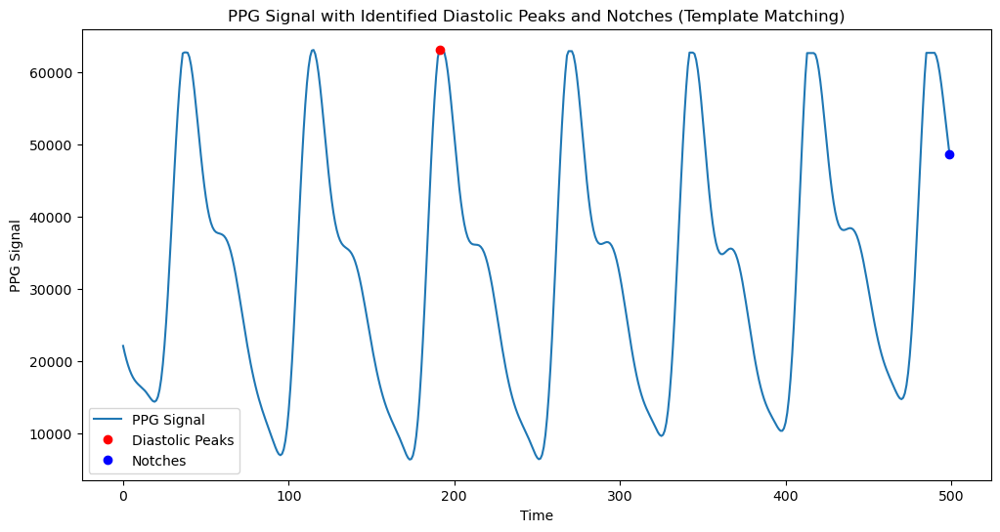

In [20]:
from scipy.signal import correlate
# Step 2: Define templates for diastolic peaks and notches
diastolic_peak_template = np.array([0, 1, 0])  # Simple template for diastolic peak
notch_template = np.array([-1, 2, -1])  # Simple template for notch

# Step 3: Perform cross-correlation to find occurrences of templates within the PPG signal
diastolic_peak_correlation = correlate(ppg_signal, diastolic_peak_template, mode='same')
notch_correlation = correlate(ppg_signal, notch_template, mode='same')

# Step 4: Find peaks in the cross-correlation results to locate occurrences of templates
diastolic_peak_indices = np.where(diastolic_peak_correlation == np.max(diastolic_peak_correlation))[0]
notch_indices = np.where(notch_correlation == np.max(notch_correlation))[0]

# Step 5: Plot the PPG signal with identified diastolic peaks and notches
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(diastolic_peak_indices, ppg_signal[diastolic_peak_indices], 'ro', label='Diastolic Peaks')
plt.plot(notch_indices, ppg_signal[notch_indices], 'bo', label='Notches')
plt.xlabel('Time')
plt.ylabel('PPG Signal')
plt.title('PPG Signal with Identified Diastolic Peaks and Notches (Template Matching)')
plt.legend()
plt.show()

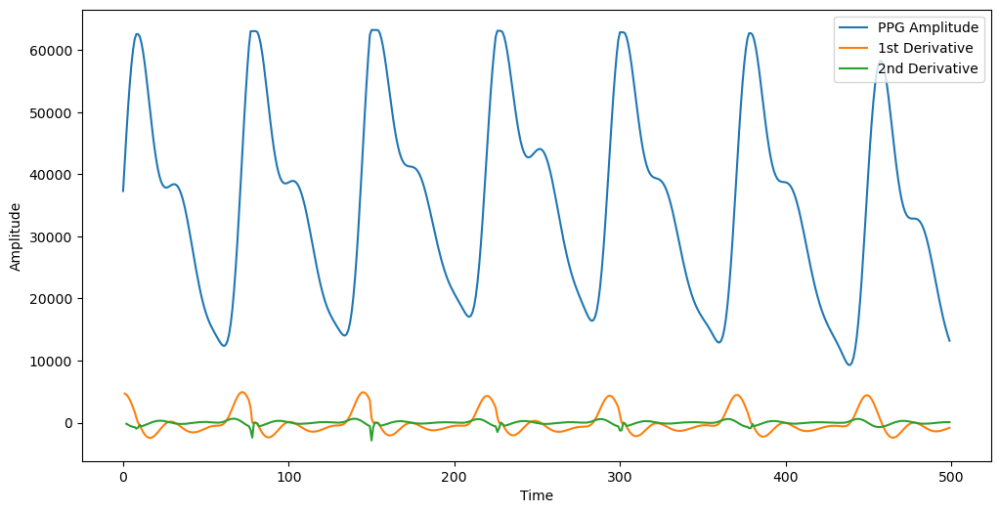

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Replace 'path/to/your/file.csv' with the actual path to your CSV file
# Assuming the PPG amplitude is in the first column named 'PPG_Amplitude'
data = pd.read_csv('tasmir_10_500_with_shifted_signal.csv')
ppg_amplitude = data['ShiftedSignal'].values[:500]

# Calculate 1st derivative
ppg_derivative = np.diff(ppg_amplitude)

# Calculate 2nd derivative
ppg_second_derivative = np.diff(ppg_derivative)

# Create a time axis (assuming equal sampling interval)
time_axis = np.arange(len(ppg_amplitude))  # Adjust if time data exists in your CSV
plt.figure(figsize=(12, 6))
# Plot PPG amplitude, 1st derivative, and 2nd derivative
plt.plot(time_axis, ppg_amplitude, label='PPG Amplitude')
plt.plot(time_axis[1:], ppg_derivative, label='1st Derivative')  # Adjust indexing if time starts at 1
plt.plot(time_axis[2:], ppg_second_derivative, label='2nd Derivative')  # Adjust indexing if time starts at 1

plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

In [14]:
# Calculate derivatives
ppg_derivative = np.diff(ppg_amplitude)
ppg_second_derivative = np.diff(ppg_derivative)

# Find potential peak indices (2nd derivative sign change)
potential_peak_indices = np.where(np.diff(ppg_second_derivative) < 0)[0] + 1

# Filter for maxima in 2nd derivative (systolic peak candidates)
systolic_peak_candidates = ppg_amplitude[potential_peak_indices]
systolic_peak_indices = potential_peak_indices[systolic_peak_candidates == systolic_peak_candidates.max()]

# Estimate diastolic notch based on first derivative and search window
diastolic_notch_candidates = []
for peak_index in systolic_peak_indices:
    # Search for minima in a window around the peak (focusing on 1st derivative)
    window_start = max(0, peak_index - 5)  # Adjust window size as needed
    window_end = min(len(ppg_amplitude), peak_index + 10)  # Adjust window size for potential tail
    potential_notch_index = np.argmin(ppg_derivative[window_start:window_end]) + window_start
    diastolic_notch_candidates.append(potential_notch_index)

# Refine notch selection based on additional criteria (optional)
# You can add logic here to filter notches based on amplitude thresholds or proximity to the peak

# Print results (assuming you want the first detected peak and notch)
if len(systolic_peak_indices) > 0:
    systolic_peak_value = ppg_amplitude[systolic_peak_indices[0]]
    systolic_peak_index = systolic_peak_indices[0]
    print(f"Systolic Peak: Index - {systolic_peak_index}, Amplitude - {systolic_peak_value}")

if len(diastolic_notch_candidates) > 0:
    diastolic_notch_value = ppg_amplitude[diastolic_notch_candidates[0]]
    diastolic_notch_index = diastolic_notch_candidates[0]
    print(f"Diastolic Notch: Index - {diastolic_notch_index}, Amplitude - {diastolic_notch_value}")
else:
    print("No diastolic notch found within search window.")

Systolic Peak: Index - 152, Amplitude - 63216.66611921156
Diastolic Notch: Index - 160, Amplitude - 54977.74593636295


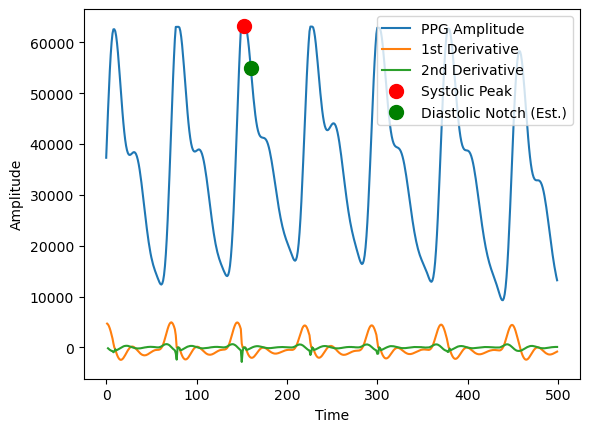

In [15]:
ppg_derivative = np.diff(ppg_amplitude)
ppg_second_derivative = np.diff(ppg_derivative)

# Find potential peak indices (2nd derivative sign change)
potential_peak_indices = np.where(np.diff(ppg_second_derivative) < 0)[0] + 1

# Filter for maxima in 2nd derivative (systolic peak candidates)
systolic_peak_candidates = ppg_amplitude[potential_peak_indices]
systolic_peak_indices = potential_peak_indices[systolic_peak_candidates == systolic_peak_candidates.max()]

# Estimate diastolic notch based on first derivative and search window
diastolic_notch_candidates = []
for peak_index in systolic_peak_indices:
    # Search for minima in a window around the peak (focusing on 1st derivative)
    window_start = max(0, peak_index - 5)  # Adjust window size as needed
    window_end = min(len(ppg_amplitude), peak_index + 10)  # Adjust window size for potential tail
    potential_notch_index = np.argmin(ppg_derivative[window_start:window_end]) + window_start
    diastolic_notch_candidates.append(potential_notch_index)

# Refine notch selection based on additional criteria (optional)
# You can add logic here to filter notches based on amplitude thresholds or proximity to the peak

# Create a time axis (assuming equal sampling interval)
time_axis = np.arange(len(ppg_amplitude))  # Adjust if time data exists

# Plot PPG signal, derivatives, and annotations
plt.plot(time_axis, ppg_amplitude, label='PPG Amplitude')
plt.plot(time_axis[1:], ppg_derivative, label='1st Derivative')
plt.plot(time_axis[2:], ppg_second_derivative, label='2nd Derivative')

# Plot annotations for detected peaks and notches (if found)
if len(systolic_peak_indices) > 0:
    systolic_peak_value = ppg_amplitude[systolic_peak_indices[0]]
    systolic_peak_index = time_axis[systolic_peak_indices[0]]
    plt.plot(systolic_peak_index, systolic_peak_value, 'ro', markersize=10, label='Systolic Peak')
if len(diastolic_notch_candidates) > 0:
    diastolic_notch_value = ppg_amplitude[diastolic_notch_candidates[0]]
    diastolic_notch_index = time_axis[diastolic_notch_candidates[0]]
    plt.plot(diastolic_notch_index, diastolic_notch_value, 'go', markersize=10, label='Diastolic Notch (Est.)')

plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.legend()
plt.show()

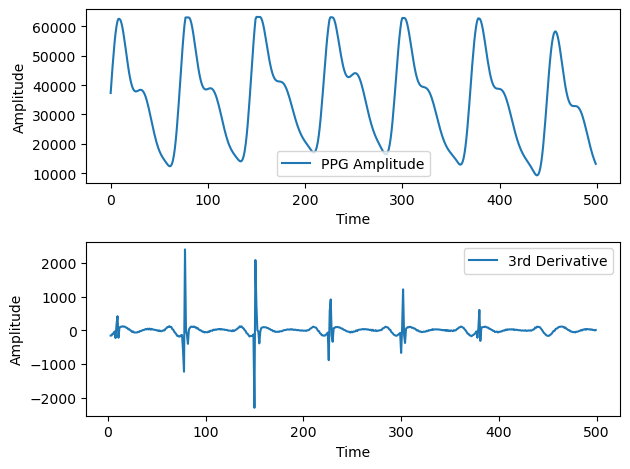

<Figure size 1200x600 with 0 Axes>

In [30]:
# Calculate 3rd derivative
# Normalize 3rd derivative (optional)
ppg_third_derivative_normalized = ppg_third_derivative / np.max(np.abs(ppg_third_derivative))  # Normalize for better visualization

# Create subplots (2 rows, 1 column)
fig, (ax1, ax2) = plt.subplots(2, 1)  # Adjust rows and columns as needed

# Plot PPG signal in the first subplot (ax1)
ax1.plot(time_axis, ppg_amplitude, label='PPG Amplitude')
ax1.set_xlabel('Time')
ax1.set_ylabel('Amplitude')
ax1.legend()

# Plot 3rd derivative (normalized or original) in the second subplot (ax2)
ax2.plot(time_axis[3:], ppg_third_derivative_normalized if 'normalized' in locals() else ppg_third_derivative, label='3rd Derivative')  # Adjust indexing
ax2.set_xlabel('Time')
ax2.set_ylabel('Amplitude')
ax2.legend()

# Adjust layout (optional)
plt.tight_layout()  # Adjust spacing between subplots
plt.figure(figsize=(12, 6))
plt.show()

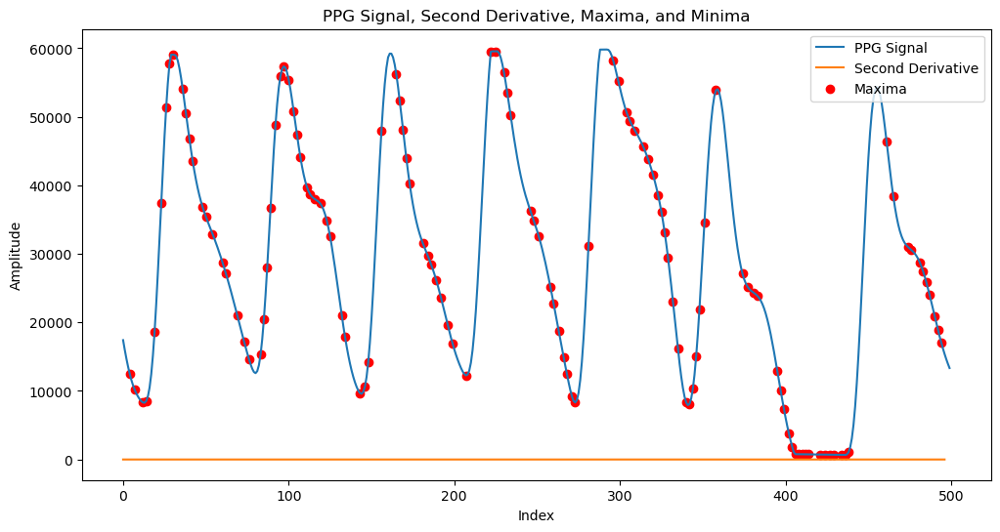

PPG values at maxima: [12504.24426604 10169.36153999  8315.49539724  8545.57910972
 18590.00757134 37354.70024533 51299.49712328 57711.1845674
 59043.01099489 54042.43492526 50445.92520016 46840.60562354
 43571.48479484 36834.39310158 35405.1430864  32916.35136545
 28766.51285093 27190.74426063 20968.63434198 17241.76899258
 14653.83896037 15282.41727064 20437.77609052 27968.41090457
 36707.32095106 48758.69972708 55941.69071114 57346.68858733
 55395.68603458 50789.27702685 47343.32962206 44169.63897804
 39757.01499898 38662.07468606 37953.11827737 37359.69470935
 34841.9339742  32509.38808153 21047.65195077 17888.04219847
  9698.61862471 10614.26264829 14160.89334325 48008.89792781
 56156.86709722 52403.71589481 48150.6601423  43981.69348703
 40269.80956213 31525.97358066 29702.64170896 28445.14007603
 26226.95120668 23552.81971193 19616.03041396 16856.95077678
 12271.28834475 59483.10411874 59547.25463298 56424.09527465
 53446.87274476 50162.55184303 36236.28839269 34835.14470037
 32

In [60]:
# Step 2: Compute the second derivative of the PPG signal
second_derivative = ppg_third_derivative_normalized

# Step 3: Identify maxima and minima of the second derivative
maxima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) < 0))[0] + 1
minima_indices = np.where((np.diff(np.sign(np.diff(second_derivative))) > 0))[0] + 1

# Step 4: Find corresponding values in the PPG signal
maxima_values = ppg_signal[maxima_indices]
minima_values = ppg_signal[minima_indices]

# Plot the PPG signal, its second derivative, maxima, and minima
plt.figure(figsize=(12, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(second_derivative, label='Second Derivative')
plt.scatter(maxima_indices, maxima_values, color='red', label='Maxima')
# plt.scatter(minima_indices, minima_values, color='green', label='Minima')
plt.xlabel('Index')
plt.ylabel('Amplitude')
plt.title('PPG Signal, Second Derivative, Maxima, and Minima')
plt.legend()
plt.show()

# Print the values where maxima and minima occur in the PPG signal
print("PPG values at maxima:", maxima_values)
print("PPG values at minima:", minima_values)

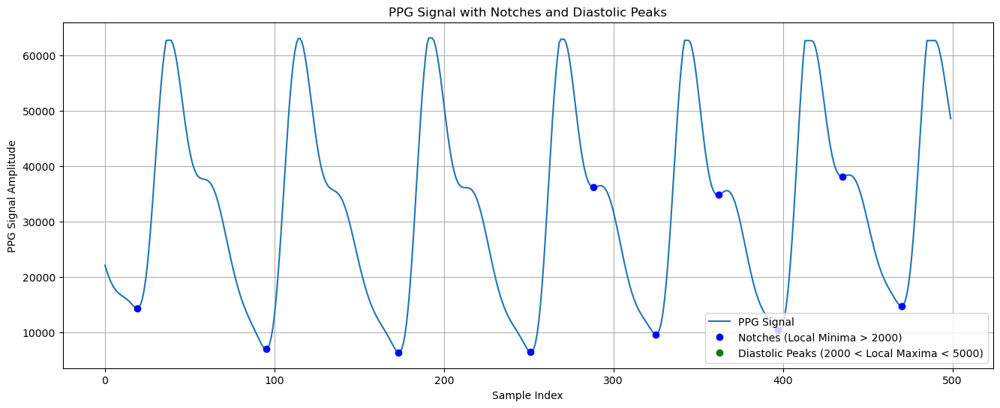

Notches at indices: [19, 95, 173, 251, 288, 325, 362, 397, 435, 470]
Diastolic peaks at indices: []


In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load PPG Signal
df = pd.read_csv('tasmir_10_500_with_shifted_signal.csv')  # Replace with your file name
ppg_signal = df['ShiftedSignal'].values[10000:10500]
time_stamps = df['Time'].values[10000:10500]

# Peak detection for local minima (notches) and local maxima (diastolic peaks) in the PPG signal
minima_indices, _ = find_peaks(-ppg_signal)  # Using negative signal to find minima
minima_values = ppg_signal[minima_indices]

maxima_indices, _ = find_peaks(ppg_signal)  # Finding maxima
maxima_values = ppg_signal[maxima_indices]

# Classify minima as notches (local minima > 2000)
notch_indices = [index for index, value in zip(minima_indices, minima_values) if value > 2000]

# Classify maxima as diastolic peaks (2000 < local maxima < 5000)
diastolic_peak_indices = [index for index, value in zip(maxima_indices, maxima_values) if 2000 < value < 5000]

# Plot the PPG signal with marked notches and diastolic peaks
plt.figure(figsize=(16, 6))  # Adjust figure size as needed
plt.plot(ppg_signal, label='PPG Signal')

# Mark notches with blue circles
plt.plot(notch_indices, ppg_signal[notch_indices], 'bo', markersize=6, label='Notches (Local Minima > 2000)')

# Mark diastolic peaks with green circles
plt.plot(diastolic_peak_indices, ppg_signal[diastolic_peak_indices], 'go', markersize=6, label='Diastolic Peaks (2000 < Local Maxima < 5000)')

# Plot settings
plt.xlabel('Sample Index')
plt.ylabel('PPG Signal Amplitude')
plt.title('PPG Signal with Notches and Diastolic Peaks')
plt.legend()
plt.grid(True)
plt.show()

# Print the values and indices of the notches and diastolic peaks
print(f'Notches at indices: {notch_indices}')
print(f'Diastolic peaks at indices: {diastolic_peak_indices}')


Peaks indices: [ 38 115 191 269 292 342 367 413 439 490]
Valleys indices: [ 19  95 173 251 288 325 362 397 435 470]


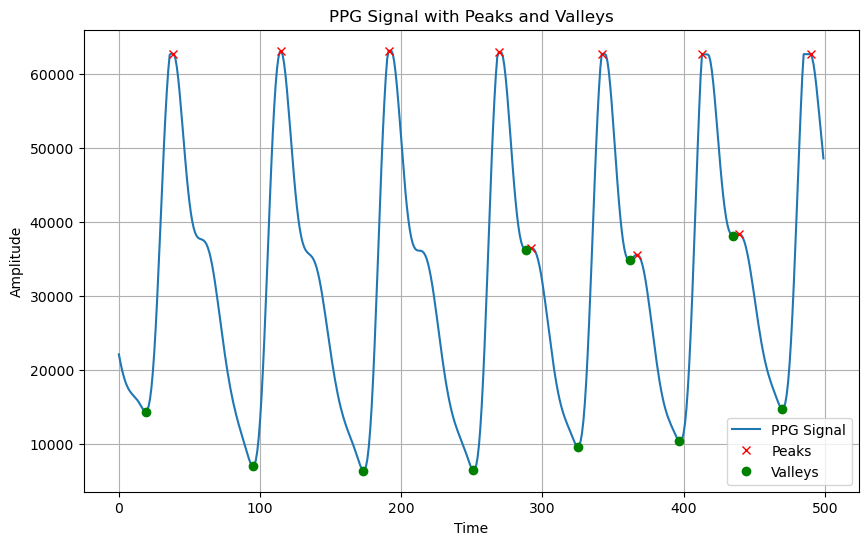

In [78]:
# Step 2: Find peaks (maxima) and valleys (minima) in the PPG signal
peaks_idx = argrelextrema(ppg_signal, np.greater)[0]  # Find peaks
valleys_idx = argrelextrema(ppg_signal, np.less)[0]   # Find valleys

# Step 3: Output peaks and valleys
print("Peaks indices:", peaks_idx)
print("Valleys indices:", valleys_idx)

# Optionally, you can plot the signal and mark the peaks and valleys for visualization
plt.figure(figsize=(10, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(peaks_idx, ppg_signal[peaks_idx], "x", label='Peaks', color='r')
plt.plot(valleys_idx, ppg_signal[valleys_idx], "o", label='Valleys', color='g')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('PPG Signal with Peaks and Valleys')
plt.legend()
plt.grid(True)
plt.show()

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load PPG Signal
df = pd.read_csv('tasmir_10_500_with_shifted_signal.csv')  # Replace with your file name
ppg_signal = df['ShiftedSignal']
time_stamps = df['Time']

# Step 2: Find peaks (maxima) and valleys (minima) in the PPG signal
peaks_idx = argrelextrema(ppg_signal, np.greater)[0]  # Find peaks
valleys_idx = argrelextrema(ppg_signal, np.less)[0]   # Find valleys

# Step 3: Extract amplitudes of peaks and valleys
peaks_amplitudes = ppg_signal[peaks_idx]
valleys_amplitudes = ppg_signal[valleys_idx]

# Step 4: Filter peaks and valleys based on amplitude range 30000 to 50000
peaks_within_range_idx = peaks_idx[(peaks_amplitudes >= 30000) & (peaks_amplitudes <= 50000)]
valleys_within_range_idx = valleys_idx[(valleys_amplitudes >= 30000) & (valleys_amplitudes <= 50000)]

# Step 5: Output indices of peaks and valleys within the specified range
print("Peaks indices between 30000 and 50000:", peaks_within_range_idx)
print("Valleys indices between 30000 and 50000:", valleys_within_range_idx)

# Optionally, you can plot the signal and mark the filtered peaks and valleys for visualization
plt.figure(figsize=(10, 6))
plt.plot(ppg_signal, label='PPG Signal')
plt.plot(peaks_within_range_idx, ppg_signal[peaks_within_range_idx], "x", label='Peaks', color='r')
plt.plot(valleys_within_range_idx, ppg_signal[valleys_within_range_idx], "o", label='Valleys', color='g')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('PPG Signal with Peaks and Valleys between 30000 and 50000')
plt.legend()
plt.grid(True)
plt.show()

ValueError: the 'mode' parameter is not supported in the pandas implementation of take()

In [85]:
# Step 5: Get the number of peaks and valleys within the specified range
num_peaks_within_range = len(peaks_within_range_idx)
num_valleys_within_range = len(valleys_within_range_idx)

# Step 6: Output the number of peaks and valleys within the specified range
print("Number of peaks", num_peaks_within_range)
print("Number of valleys ", num_valleys_within_range)

Number of peaks between 30000 and 50000: 3
Number of valleys between 30000 and 50000: 3


In [91]:
import pandas as pd
import numpy as np
from scipy.signal import argrelextrema

# Step 1: Read the CSV file
csv_file_path = "tasmir_10_500_with_shifted_signal.csv"
df = pd.read_csv(csv_file_path)

# Assuming the PPG signal is stored in a column named 'ppg_signal'
ppg_signal = df['ShiftedSignal'].values

# Step 2: Find peaks (maxima) and valleys (minima) in the PPG signal
peaks_idx = argrelextrema(ppg_signal, np.greater)[0]  # Find peaks
valleys_idx = argrelextrema(ppg_signal, np.less)[0]   # Find valleys

# Step 3: Extract amplitudes of peaks and valleys
peaks_amplitudes = ppg_signal[peaks_idx]
valleys_amplitudes = ppg_signal[valleys_idx]

# Step 4: Filter peaks and valleys based on amplitude range 30000 to 50000
peaks_within_range_idx = peaks_idx[(peaks_amplitudes >= 30000) & (peaks_amplitudes <= 50000)]
valleys_within_range_idx = valleys_idx[(valleys_amplitudes >= 30000) & (valleys_amplitudes <= 50000)]

# Step 5: Get the number of peaks and valleys within the specified range
num_peaks_within_range = len(peaks_within_range_idx)
num_valleys_within_range = len(valleys_within_range_idx)

# Step 6: Output the number of peaks and valleys within the specified range
print("Number of peaks ", num_peaks_within_range)
print("Number of valleys ", num_valleys_within_range)

Number of peaks  755
Number of valleys  560


In [90]:
import pandas as pd
import numpy as np
from scipy.signal import argrelextrema

# Step 1: Read the CSV file
csv_file_path = "imrul_10_500_with_shifted_signal.csv"
df = pd.read_csv(csv_file_path)

# Assuming the PPG signal is stored in a column named 'ppg_signal'
ppg_signal = df['ShiftedSignal'].values

# Step 2: Find peaks (maxima) and valleys (minima) in the PPG signal
peaks_idx = argrelextrema(ppg_signal, np.greater)[0]  # Find peaks
valleys_idx = argrelextrema(ppg_signal, np.less)[0]   # Find valleys

# Step 3: Extract amplitudes of peaks and valleys
peaks_amplitudes = ppg_signal[peaks_idx]
valleys_amplitudes = ppg_signal[valleys_idx]

# Step 4: Filter peaks and valleys based on amplitude range 30000 to 50000
peaks_within_range_idx = peaks_idx[(peaks_amplitudes >= 30000) & (peaks_amplitudes <= 50000)]
valleys_within_range_idx = valleys_idx[(valleys_amplitudes >= 30000) & (valleys_amplitudes <= 50000)]

# Step 5: Get the number of peaks and valleys within the specified range
num_peaks_within_range = len(peaks_within_range_idx)
num_valleys_within_range = len(valleys_within_range_idx)

# Step 6: Output the number of peaks and valleys within the specified range
print("Number of peaks ", num_peaks_within_range)
print("Number of valleys ", num_valleys_within_range)

Number of peaks  386
Number of valleys  224


Number of peaks  4
Number of valleys  2


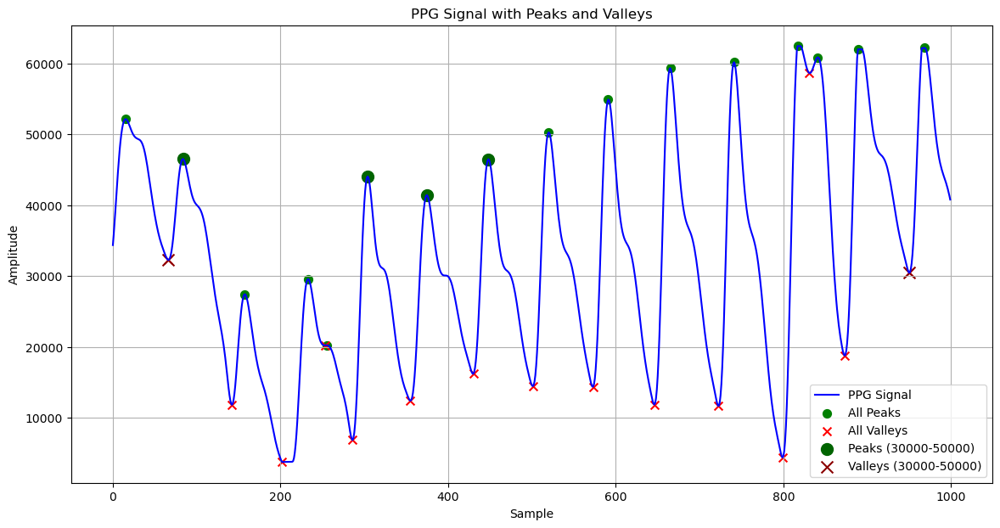

In [99]:
import pandas as pd
import numpy as np
from scipy.signal import argrelextrema

# Step 1: Read the CSV file
csv_file_path = "prince_10_500_with_shifted_signal.csv"
df = pd.read_csv(csv_file_path)

# Assuming the PPG signal is stored in a column named 'ppg_signal'
ppg_signal = df['ShiftedSignal'].values[1000:2000]

# Step 2: Find peaks (maxima) and valleys (minima) in the PPG signal
peaks_idx = argrelextrema(ppg_signal, np.greater)[0]  # Find peaks
valleys_idx = argrelextrema(ppg_signal, np.less)[0]   # Find valleys

# Step 3: Extract amplitudes of peaks and valleys
peaks_amplitudes = ppg_signal[peaks_idx]
valleys_amplitudes = ppg_signal[valleys_idx]

# Step 4: Filter peaks and valleys based on amplitude range 30000 to 50000
peaks_within_range_idx = peaks_idx[(peaks_amplitudes >= 30000) & (peaks_amplitudes <= 50000)]
valleys_within_range_idx = valleys_idx[(valleys_amplitudes >= 30000) & (valleys_amplitudes <= 50000)]

# Step 5: Get the number of peaks and valleys within the specified range
num_peaks_within_range = len(peaks_within_range_idx)
num_valleys_within_range = len(valleys_within_range_idx)

# Step 6: Output the number of peaks and valleys within the specified range
print("Number of peaks ", num_peaks_within_range)
print("Number of valleys ", num_valleys_within_range)
# Step 7: Plot the PPG signal and highlight the peaks and valleys within the range
plt.figure(figsize=(14, 7))
plt.plot(ppg_signal, label='PPG Signal', color='blue')

# Highlight all peaks and valleys
plt.scatter(peaks_idx, ppg_signal[peaks_idx], color='green', marker='o', label='All Peaks', s=50)
plt.scatter(valleys_idx, ppg_signal[valleys_idx], color='red', marker='x', label='All Valleys', s=50)

# Highlight peaks and valleys within the specified range
plt.scatter(peaks_within_range_idx, ppg_signal[peaks_within_range_idx], color='darkgreen', marker='o', label='Peaks (30000-50000)', s=100)
plt.scatter(valleys_within_range_idx, ppg_signal[valleys_within_range_idx], color='darkred', marker='x', label='Valleys (30000-50000)', s=100)

plt.xlabel('Sample')
plt.ylabel('Amplitude')
plt.title('PPG Signal with Peaks and Valleys')
plt.legend()
plt.grid(True)
plt.show()